In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config IPCompleter.greedy=True

In [23]:
from fastai.imports import *
from fastai.tabular import *
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from IPython.display import display
from sklearn import metrics
import shap

shap.initjs()

In [3]:
def display_all(df):
    with pd.option_context("display.max_rows", 1000): 
        with pd.option_context("display.max_columns", 1000): 
            display(df)
def info(df):
    datatypes = pd.Series(df.dtypes, name='datatype')
    na_count = pd.Series(df.isna().sum(), name='na_count')
    with pd.option_context('display.max_rows',1000,'display.max_columns',1000):
        display(pd.concat([datatypes, na_count],axis=1))
        
def split_vals(a,n, col): return a[:n].copy().drop(col, axis=1), a[:n].copy()[col], a[n:].copy().drop(col, axis=1), a[n:].copy()[col]

def print_score(m):
    res = [rmse(m.predict(X_train), y_train), rmse(m.predict(X_valid), y_valid),
                m.score(X_train, y_train), m.score(X_valid, y_valid)]
    if hasattr(m, 'oob_score_'): res.append(m.oob_score_)
    print(res)

In [4]:
PATH= "storage/housing/"

In [5]:
train = pd.read_csv(f'{PATH}train.csv')
train = train.drop('Id', axis=1)
train.SalePrice = np.log1p(train.SalePrice)


In [6]:
cat_names = ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'ExterQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']
cont_names = ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MoSold', 'YrSold', 'MiscVal']

In [7]:
train['YearsSinceRemodel'] = train['YrSold'] - train['YearRemodAdd']
cont_names.append('YearsSinceRemodel')

In [8]:
tfm = FillMissing(cat_names, cont_names)
tfm(train)

In [9]:
tfm = Categorify(cat_names, cont_names)
tfm(train)

In [17]:
display_all(train)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,YearsSinceRemodel,LotFrontage_na,MasVnrArea_na,GarageYrBlt_na
0,5,3,-0.220799,-0.207071,1,-1,3,3,0,4,0,5,2,2,0,5,6,4,1.050634,0.878367,1,1,12,13,1,0.513928,2,4,2,2,3,3,2,706,5,0,150,856,1,0,1,4,-0.793162,1.161454,-0.120201,0.370207,1.107430,-0.240978,0.789470,1.227165,0.163723,-0.211381,2,8,6,-0.950901,-1,1,1.017250,1,0.311618,0.350880,4,4,2,-0.751918,0.216429,-0.359202,-0.116299,-0.270116,-0.068668,-1,-1,-1,-0.087658,-1.598563,0.138730,8,4,12.247699,-0.869643,0,0,0
1,0,3,0.460162,-0.091855,1,-1,3,3,0,2,0,24,1,2,0,2,5,7,0.156680,-0.429430,1,1,8,8,2,-0.570555,3,4,1,2,3,1,0,978,5,0,284,1262,1,0,1,4,0.257052,-0.794891,-0.120201,-0.482347,-0.819683,3.947455,0.789470,-0.761360,0.163723,-0.211381,3,6,6,0.600289,4,1,-0.107890,1,0.311618,-0.060710,4,4,2,1.625638,-0.704242,-0.359202,-0.116299,-0.270116,-0.068668,-1,-1,-1,-0.087658,-0.488943,-0.614228,8,4,12.109016,0.390007,0,0,0
2,5,3,-0.084607,0.073455,1,-1,0,3,0,4,0,5,2,2,0,5,6,4,0.984415,0.829930,1,1,12,13,1,0.325803,2,4,2,2,3,2,2,486,5,0,434,920,1,0,1,4,-0.627611,1.188943,-0.120201,0.514836,1.107430,-0.240978,0.789470,1.227165,0.163723,-0.211381,2,6,6,0.600289,4,1,0.933906,1,0.311618,0.631510,4,4,2,-0.751918,-0.070337,-0.359202,-0.116299,-0.270116,-0.068668,-1,-1,-1,-0.087658,0.990552,0.138730,8,4,12.317171,-0.821195,0,0,0
3,6,3,-0.447787,-0.096864,1,-1,0,3,0,0,0,6,2,2,0,5,6,4,-1.862993,-0.720051,1,1,13,15,2,-0.570555,3,4,0,3,1,3,0,216,5,0,540,756,1,2,1,4,-0.521555,0.936955,-0.120201,0.383528,1.107430,-0.240978,-1.025689,-0.761360,0.163723,-0.211381,2,7,6,0.600289,2,5,0.808890,2,1.649741,0.790533,4,4,2,-0.751918,-0.175988,4.091122,-0.116299,-0.270116,-0.068668,-1,-1,-1,-0.087658,-1.598563,-1.367186,8,0,11.849405,0.632247,0,0,0
4,5,3,0.641752,0.375020,1,-1,0,3,0,2,0,15,2,2,0,5,7,4,0.951306,0.733056,1,1,12,13,1,1.366021,2,4,2,2,3,0,2,655,5,0,490,1145,1,0,1,4,-0.045596,1.617323,-0.120201,1.298881,1.107430,-0.240978,0.789470,1.227165,1.389546,-0.211381,2,9,6,0.600289,4,1,0.892234,1,1.649741,1.697903,4,4,2,0.779930,0.563567,-0.359202,-0.116299,-0.270116,-0.068668,-1,-1,-1,-0.087658,2.100173,0.138730,8,4,12.429220,-0.724299,0,0,0
5,4,3,0.687149,0.360493,1,-1,0,3,0,4,0,11,2,2,0,0,4,4,0.719540,0.490872,1,1,12,13,2,-0.570555,3,4,5,2,3,3,2,732,5,0,64,796,1,0,1,4,-0.948366,0.501703,-0.120201,-0.292045,1.107430,-0.240978,-1.025689,1.227165,-2.287924,-0.211381,3,5,6,-0.950901,-1,1,0.600531,2,0.311618,0.032833,4,4,2,-0.432783,-0.251453,-0.359202,10.798746,-0.270116,-0.068668,-1,2,2,1.323283,1.360426,0.891688,8,4,11.870607,-0.433610,0,0,0
6,0,3,0.233175,-0.043364,1,-1,3,3,0,4,0,21,2,2,0,2,7,4,1.083743,0.975241,1,1,12,13,3,0.458597,2,4,2,0,3,0,2,1369,5,0,317,1686,1,0,1,4,1.374522,-0.794891,-0.120201,0.339758,1.107430,-0.240978,0.789470,-0.761360,0.163723,-0.211381,2,7,6,0.600289,2,1,1.058921,1,0.311618,0.762470,4,4,2,1.282568,0.156057,-0.359202,-0.116299,-0.270116,-0.068668,-1,-1,-1,-0.087658,0.620678,-0.614228,8,4,12.634606,-1.014987,0,0,0
7,5,3,-0.039210,-0.013508,1,-1,0,3,0,0,0,14,4,2,0,5,6,5,0.057352,-0.574741,1,1,6,6,3,0.757383,3,4,1,2,3,2,0,859,1,32,216,1107,1,0,1,4,-0.143892,1.456967,-0.120201,1.093354,1.107430,-0.240978,0.789470,1.227165,0.163723,-0.211

In [11]:
norm = Normalize(cat_names, cont_names)
norm(train)

In [ ]:
display_all(train)

In [12]:
for col in train.select_dtypes('category'):
        train[col] = train[col].cat.codes


In [13]:
train_x, train_y, test_x, test_y = split_vals(train, 1200, 'SalePrice')

In [15]:
m = RandomForestRegressor(n_jobs=-1, n_estimators=100, random_state=12345)
m.fit(train_x, train_y)
m.score(test_x,test_y)

0.8507118383685354

In [16]:
feature_importances = pd.DataFrame(m.feature_importances_,
                                   index = train_x.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

In [18]:
feature_importances

,importance
OverallQual,0.547673
GrLivArea,0.115370
TotalBsmtSF,0.057075
GarageCars,0.032248
BsmtFinSF1,0.024101
GarageArea,0.021131
1stFlrSF,0.018804
YearBuilt,0.016986
YearsSinceRemodel,0.011897
LotArea,0.011192


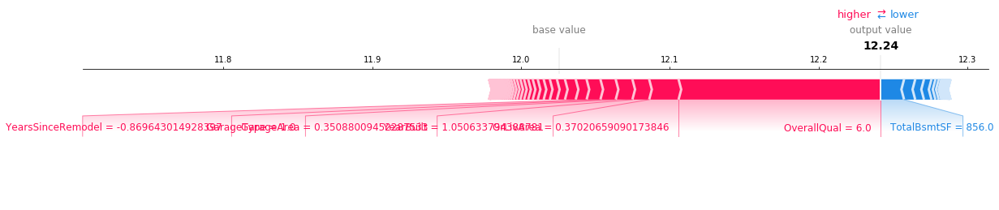

In [19]:
explainer = shap.TreeExplainer(m)
shap_values = explainer.shap_values(train_x)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], train_x.iloc[0,:], matplotlib=True)

In [24]:
shap.force_plot(explainer.expected_value, shap_values, train_x)

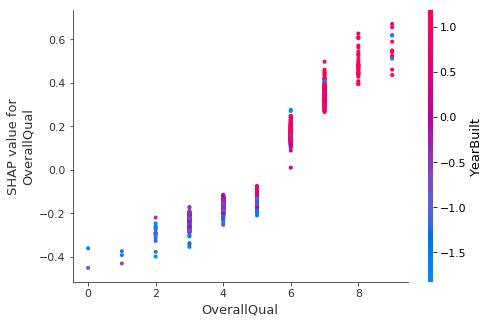

In [21]:
shap.dependence_plot("OverallQual", shap_values, train_x)

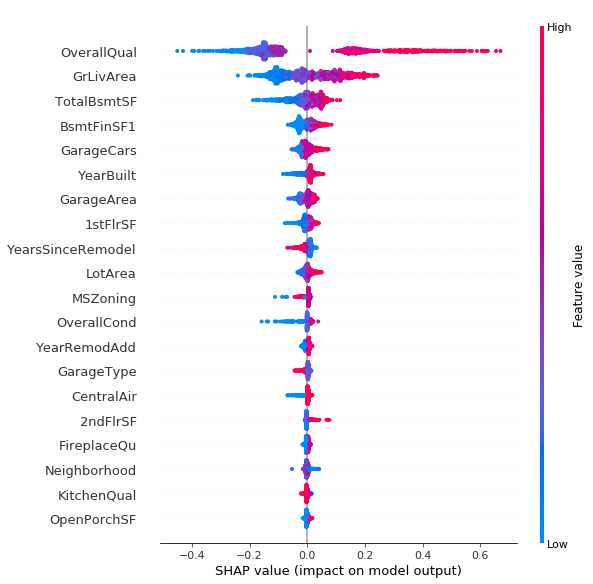

In [22]:
shap.summary_plot(shap_values, train_x)